<h1>Содержание<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Загрузка-и-знакомство-с-данными" data-toc-modified-id="Загрузка-и-знакомство-с-данными-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Загрузка и знакомство с данными</a></span></li><li><span><a href="#Предобработка-данных" data-toc-modified-id="Предобработка-данных-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Предобработка данных</a></span><ul class="toc-item"><li><span><a href="#Обработка-дубликатов" data-toc-modified-id="Обработка-дубликатов-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Обработка дубликатов</a></span></li><li><span><a href="#Обработка-пропусков" data-toc-modified-id="Обработка-пропусков-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Обработка пропусков</a></span></li><li><span><a href="#Создание-дополнительных-столбцов" data-toc-modified-id="Создание-дополнительных-столбцов-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Создание дополнительных столбцов</a></span></li></ul></li><li><span><a href="#Анализ-данных" data-toc-modified-id="Анализ-данных-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Анализ данных</a></span></li><li><span><a href="#Детализация-исследования:-открытие-кофейни" data-toc-modified-id="Детализация-исследования:-открытие-кофейни-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Детализация исследования: открытие кофейни</a></span></li><li><span><a href="#Рекомендации-по-открытию-кофейни" data-toc-modified-id="Рекомендации-по-открытию-кофейни-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Рекомендации по открытию кофейни</a></span></li></ul></div>

# Анализ рынка заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Они просят подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Для анализа доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

<br>Исходные датасет представлен в следующей структуре:

- name — название заведения;
- address — адрес заведения;
- category — категория заведения;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона;
- middle_avg_bill — число с оценкой среднего чека;
- middle_coffee_cup — число с оценкой одной чашки капучино;
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым;
- district — административный район, в котором находится заведение;
- seats — количество посадочных мест.

### Загрузка и знакомство с данными

In [1]:
# Импорт необходимых библиотек
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from plotly import graph_objects as go
import numpy as np
import json
from folium import Map, Marker, Choropleth
from folium.plugins import MarkerCluster
from folium.features import CustomIcon
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Загрузка файла с локального ПК и платформы Яндекс Практикум
try:
    data = pd.read_csv('D:\Учеба\Аналитик данных\Проекты\Проект 9 Рынок заведений Москвы\\moscow_places.csv')
except:
    data = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
# Создадим функцию для получения общей информации о датафрейме
def info(data):
    display(data.head())
    display(data.info())
    display(data.isna().sum())
    print(f'Количество полных дубликатов: {data.duplicated().sum()}')

In [4]:
# Применим созданную функцию к датафрейму
info(data)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Количество полных дубликатов: 0


<div style="border:solid Green 2px; padding: 20px">
    
Датасет представлен 14 столбцами и 8406 строками. В целом тип данных в столбцах соответствует действительному. Только в столбцах `middle_avg_bill, middle_coffee_cup и seats` возможны корректировки: количество мест должно быть целочисленным, а тип данных `float` получился из-за наличия пропусков. Касаемо предыдущих двух столбцов возможны дробные значения, так как в части строк определяется медианное значение. <br>
Также можно выделить столбец `chain`, значения которого показывают принадлежность заведения к сети. В данном случае можно заменить 1 и 0 на логический тип данных True и False. По мере анализа оценим необходимость данного действия.
В датасете большое количество пропусков: время работы завеления, цены в заведении, средний чек, количество мест. Необходимо детально рассмотреть данные столбцы, возможно удастся найти какие либо взаимосвязи и заполнить пропущенные значения. <br>
Полных дубликатов в датасете нет, однако можно рассмотреть часть датасета, чтобы увбедиться в отсутствии повторов с ошибками в орфографии и тд.

In [5]:
data['name'].value_counts()

Кафе                189
Шоколадница         120
Домино'с Пицца       76
Додо Пицца           74
One Price Coffee     71
                   ... 
Укун                  1
Домашнее              1
Ресторан Стейк'S      1
Шампур хаус           1
Корифей               1
Name: name, Length: 5614, dtype: int64

<div style="border:solid Green 2px; padding: 20px">
    
Всего в данных представлено 5614 заведений, причем явно видно разделение на сетевые заведения и уникальные кафе и рестораны. Также стоит отметить первую строчку с наибольшим количеством заведений - "Кафе". В данном случае нельзя говорить о сетевом месте, вероятнее всего это просто заведения без уникального имени, которые просто так и называются - "Кафе"

### Предобработка данных

#### Обработка дубликатов

In [6]:
# Приведем значения в строках к нижнему регистру
data[['name', 'category', 'address', 'hours', 'price', 'avg_bill']] = \
data[['name', 'category', 'address', 'hours', 'price', 'avg_bill']].apply(lambda x: x.str.lower())

In [7]:
# Определим наличие дубликатов по столбцам с названием заведения и адресом
data[data[['name','address']].duplicated(keep = False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [8]:
# Определим дубликаты по названию заведения и координатам
data[data[['name','lat', 'lng']].duplicated(keep = False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


<div style="border:solid Green 2px; padding: 20px">
    
По двум рассмотренным проверкам дубликатов удалось выявить 4 заведения, которые дублируются по названию, адресу и координатам. Главными отличиями в данном случае является время работы заведения. С целью корректного удаления дубликатов попробуем выяснить дейсвтительные часы работы заведений в интернете:<br>
- кафе - ежедневно, с 09 до 23 часов, удаляем строку с индексом 215
- more poke - заведение работает с 09 до 21, удаляем строку с индексом 1511
- раковарня клешни и хвосты - заведение работает с 12 до 00, удаляем строку с индексом 2420
- хлеб да выпечка - одна строка с временем, удаляем строку с индексом 3109

In [9]:
# Удаляем выявленные дубликаты, сбрасываем индексы
data = data.drop(index=[215, 1511, 2420, 3109]).reset_index(drop = True)

In [10]:
# Проверяем корректность выполненных действтий
data[['name','address']].duplicated().sum()

0

<div style="border:solid Green 2px; padding: 20px">
    
Выявленные дубликаты удалены, можно приступать к следующим шагам по предобработке данных

#### Обработка пропусков

In [11]:
# Повторно рассмотрим столбцы с пропусками и определим возможные действия
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64

In [12]:
# Определим долю пропусков и построим тепловую карту 
pd.DataFrame(round(data.isna().mean()*100,1)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.400000
lat,0.000000
lng,0.000000
rating,0.000000
price,60.500000
avg_bill,54.600000


<div style="border:solid Green 2px; padding: 20px">
    
`hours` - столбец с временем работы. Пропуски в данном столбце заполнить не удастся, так как все заведения индивидуальны. Даже если рассматривать сетевые рестораны - время их работы также может отличаться. <br>
`price` - цена в заведении. Данный столбец можно заполнить на основании стоимости других заведений сети. Могут быть отличия по заведениям, которые находятся в аэропортах, однако это довольно малый процент от сети.<br>
`avg_bill` - средний чек. Разная информация по разным позициям. Заполнить возможности нет.<br>
`middle_avg_bill и middle_coffee_cup` - средний чек и чашка кофе. Можно проверить корректность заполняемости на основании данных из предыдущего столбца.<br>
`seats` - количество мест. Пропуски заполнить нельзя, так как нет связанной информации.

In [13]:
# Для обработки значений в столбце с ценами добавим столбец с ценовыми группами
data['gr_price'] = data['price'].apply(lambda x: 0 if x == 'низкие' else(1 if x == 'средние' 
                                                  else(2 if x == 'высокие' else(3 if x == 'выше среднего' else np.NaN)))) 

In [14]:
# Заполним пропуски в новом столбце на основании медианных значений
for name in data['name'].unique():
    data.loc[(data['name'] == name) & (data['gr_price'].isna()), 'gr_price'] = \
    data.loc[(data['name'] == name), 'gr_price'].median().round()

In [15]:
# С помощью нового столбца восстановим значения средних цен
data['price'] = data['gr_price'].apply(lambda x: 'низкие' if x == 0 else('средние' if x == 1 
                                                  else('высокие' if x == 2 else('выше среднего' if x == 3 else np.nan))))

In [16]:
# Удаляем вспомогательнй столбец и проверяем количество пропусков
data.drop(columns = 'gr_price', inplace = True)
data['price'].isna().sum()

3659

<div style="border:solid Green 2px; padding: 20px">
    
В столбце с ценами удалось заполнить порядка 30% пропусков (1428 значений)

In [17]:
# Добавим столбец с информацией о среднем чеке на основании столбца avg_bill
data['avg_chek'] = data[data['avg_bill'].notna()]['avg_bill'].apply(
    lambda x: x.split(':')[1] if x.split(':')[0] == 'средний счёт' else np.nan
    )

In [18]:
# Проверим наличие неккоректно пустых значений в столбце middle_avg_bill
data.loc[(data['middle_avg_bill'].isna())&(data['avg_chek'].notna()), 'name'].count()

0

In [19]:
# Перезапишем данные нового столбца изменив целевой параметр на цену чашки капучино
data['avg_chek'] = data[data['avg_bill'].notna()]['avg_bill'].apply(
    lambda x: x.split(':')[1] if x.split(':')[0] == 'цена чашки капучино' else np.nan
    )

In [20]:
# Проверим наличие неккоректно пустых значений в столбце middle_coffee_cup
data.loc[(data['middle_coffee_cup'].isna())&(data['avg_chek'].notna()), 'name'].count()

0

In [21]:
# Удалим созданный для проверки столбец
data.drop(columns = 'avg_chek', inplace = True)

<div style="border:solid Green 2px; padding: 20px">
    
Все возможные значения в столбцах `middle_avg_bill и middle_coffee_cup` указаны - проверка показала, что случайных пропусков нет. <br>
    
**Вывод:** Таким образом удалось заполнить часть пропусков в столбце с ценами и провести проверку на корректность столбцов о среднем чеке и стоимости чашки капучино. Можно двигаться дальше.

#### Создание дополнительных столбцов

In [22]:
# Добавим столбец с названиями улиц
data.insert(loc = 3, column = 'street', value = data['address'].map(
    lambda x: x.split(',')[1].strip())
           )

In [23]:
# Добавим столбец с обозначением круглосуточной работы
data.insert(loc = 6, column = 'is_24/7', value = data['hours'].map(
    lambda x: True if x == 'ежедневно, круглосуточно' else False)
           )

<div style="border:solid Green 2px; padding: 20px">
    
**Вывод:** Необходимые столбцы добавлены в датафрейм; данные подготовлены к дальнейшему анализу

### Анализ данных

In [24]:
# Настроим стиль для графиков
plt.style.use('seaborn-whitegrid')

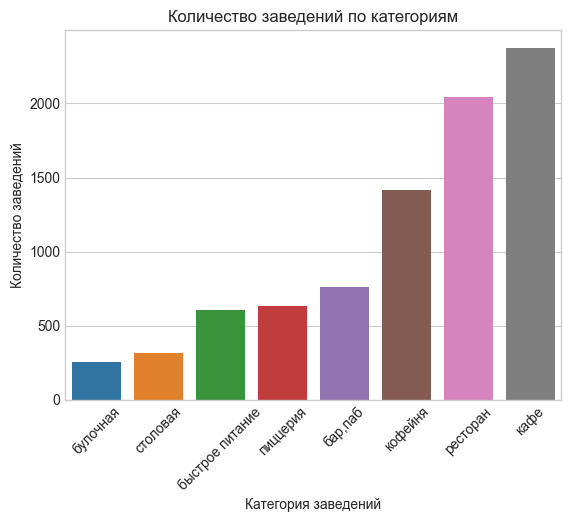

In [25]:
# Отобразим гисотграмму для распределения заведений по категориям
sns.barplot(x = 'category', y = 'name', 
            data = data.groupby('category', as_index = False).agg({'name':'count'}).sort_values(by = 'name'))
plt.title('Количество заведений по категориям')
plt.xlabel('Категория заведений')
plt.xticks(rotation=45)
plt.ylabel('Количество заведений')
plt.show()

<div style="border:solid Green 2px; padding: 20px">
    
Всего в датасете представлено 8 категорий заведений. Самое меньшее количество булочных - порядка 250 заведений, в то время как ресторан и кафе уверенно занимают лидирующие позиции с количеством в 2000 и 2500 заведений соответственно.

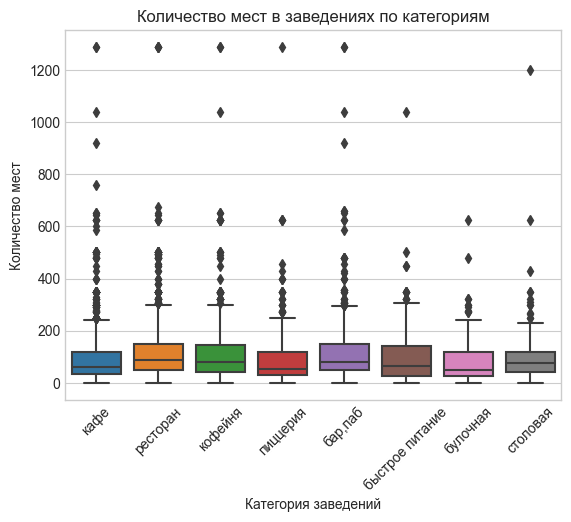

In [26]:
# Отобразим боксплот для распределения количества мест по категориям
sns.boxplot(x = 'category', y = 'seats', 
         data = data)
plt.title('Количество мест в заведениях по категориям')
plt.xlabel('Категория заведений')
plt.xticks(rotation=45)
plt.ylabel('Количество мест')
plt.show()

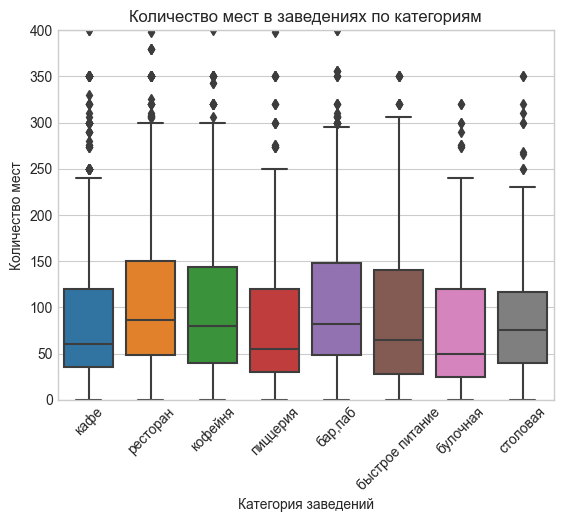

In [27]:
# Отобразим боксплот для распределения количества мест по категориям в увеличенном масштабе
sns.boxplot(x = 'category', y = 'seats', 
         data = data)
plt.ylim(0, 400)
plt.title('Количество мест в заведениях по категориям')
plt.xlabel('Категория заведений')
plt.xticks(rotation=45)
plt.ylabel('Количество мест')
plt.show()

<div style="border:solid Green 2px; padding: 20px">
    
В среднем количество мест в заведениях варьируется от 50 до 80 единиц. Самые большие показатели наблюдаются у ресторанов, кофейни, баров и заведений с быстрым питанием. Также в данных наблюдаются аномальные выбросы - заведения с количеством мест превышающим значение в 1200. Так как часть данных была внесена пользователями, возможно наблюдается ошибка. Можно удалить такие строки, однако тогда мы потеряем данные с информацией об этих заведениях. Другой возможный вариант - это замена на пропуски, либо корректировка, например деление значения свыше 350 на 10. Так как в данном столбце значительное количество пропусков и данные не полные, а боксплоты в целом продемонстрировали текущую картину, то нет смысла в выше указанных корректировках.

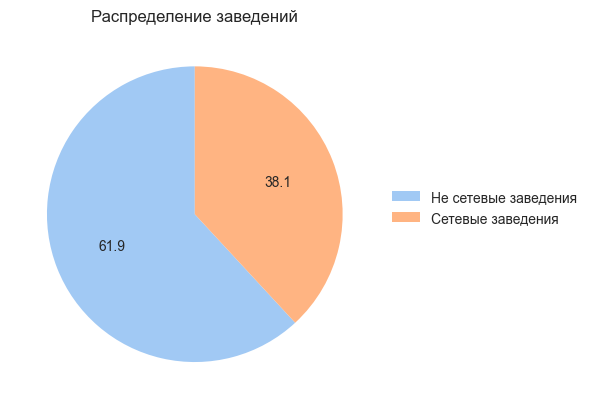

In [28]:
# Построим круговую диаграмму распределения заведений на сетевые и не сетевые
colors = sns.color_palette('pastel')
plt.pie(x = 'chain', autopct = '%.1f', colors = colors,
        data = data.groupby('chain', as_index = False).agg({'chain':'count'}), startangle = 90,
        )
plt.legend(['Не сетевые заведения', 'Сетевые заведения'], bbox_to_anchor=(1, 0.6), fontsize=10)
plt.title('Распределение заведений')
plt.show()

<div style="border:solid Green 2px; padding: 20px">
    
В основном заведения представленные в датасете являются не сетевыми. Однако стоит помнить об указнной ошибке, что маленькие сети могут быть неккоректно отнесены к уникальным заведениям. Тем не менее можно учесть эту погрешность и предположить распределение 60 на 40 с преобладанием доли не сетевых заведений.

In [29]:
# Определим долю сетевых заведений в каждой категории
chain_share = data.groupby('category', as_index = False).agg({'name':'count', 'chain':'sum'})
chain_share['share'] = round(chain_share['chain'] / chain_share['name'], 2)
chain_share = chain_share.sort_values(by = 'share')
chain_share

,category,name,chain,share
0,"бар,паб",764,168,0.22
7,столовая,315,88,0.28
3,кафе,2376,779,0.33
6,ресторан,2042,729,0.36
2,быстрое питание,603,232,0.38
4,кофейня,1413,720,0.51
5,пиццерия,633,330,0.52
1,булочная,256,157,0.61


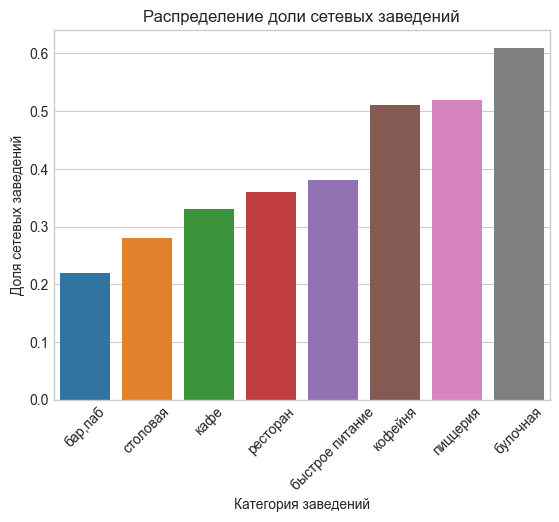

In [30]:
# Отобразим гистограмму для распределения долей сетевых заведений по категориям
sns.barplot(data = chain_share, x = 'category', y = 'share')
plt.title('Распределение доли сетевых заведений')
plt.xlabel('Категория заведений')
plt.xticks(rotation=45)
plt.ylabel('Доля сетевых заведений')
plt.show()

<div style="border:solid Green 2px; padding: 20px">
    
Топ 3 сетевые категории - это булочная, пиццерия и кофейня. Примечально то, что более 60% булочных относится к какой либо сети.

In [31]:
# Сгруппируем данные по названию заведений и выведем топ 15 по количеству
data.groupby(['name', 'category'], as_index = False).agg({'address':'count'})\
             .sort_values(by = 'address', ascending = False).head(15)

,name,category,address
3038,кафе,кафе,158
5869,шоколадница,кофейня,119
2713,домино'с пицца,пиццерия,77
2678,додо пицца,пиццерия,74
1202,one price coffee,кофейня,72
5945,яндекс лавка,ресторан,69
427,cofix,кофейня,65
1343,prime,ресторан,49
3415,кофепорт,кофейня,42
3479,кулинарная лавка братьев караваевых,кафе,39


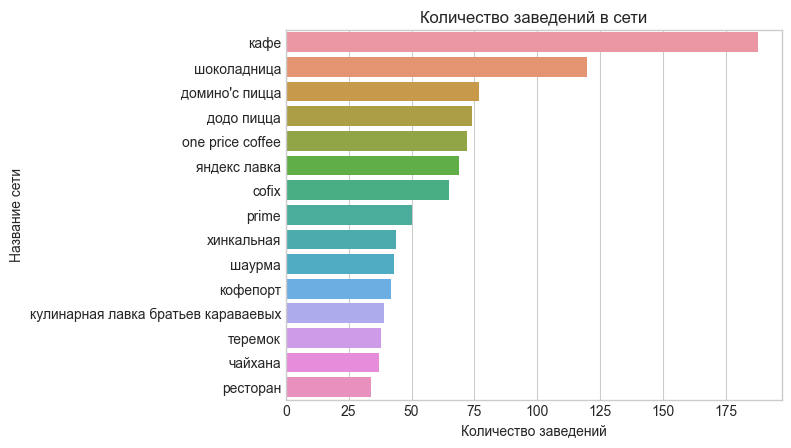

In [32]:
# Отобразим гистограмму для распределения количества заведений в сети
sns.barplot(data = data.groupby('name', as_index = False).agg({'category':'count'})\
            .sort_values(by = 'category', ascending = False).head(15), 
            x = 'category', y = 'name')
plt.title('Количество заведений в сети')
plt.xlabel('Количество заведений')
plt.ylabel('Название сети')
plt.show()

<div style="border:solid Green 2px; padding: 20px">
    
В данном своде есть 2 типа заведений - действительные сетевые места и заведения с "широким" названием: шаурма, кинкальная, кафе, ресторан. Это не название сети, это название категории или еды, поэтому такие места нельзя относить к сетевым и судить о результатах по ним.<br>
Другие же заведения, например Шоколадница, Додо, Сofix, Чайхана, Теремок и другие имеют распространение не только в Москве, но и в других регионах России. Поэтому такие заведения занимают лидирующие позиции в данном анализе. Также можно отметить, что популярные сетевые заведения относятся к таким категориям как кафе, пиццерия и ресторан.

In [33]:
# Создадим сводную таблицу по округам и категориям заведений
district_table = data.pivot_table(index = 'district', columns = 'category', values = 'name', aggfunc = 'count')
district_table['total'] = district_table.sum(axis = 1)
district_table = district_table.sort_values(by = 'total', ascending = False)
district_table

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
district,,,,,,,,,
Центральный административный округ,364,50,87,464,428,113,670,66,2242
Северный административный округ,68,39,58,234,193,77,188,41,898
Южный административный округ,68,25,85,264,131,73,202,44,892
Северо-Восточный административный округ,62,28,82,269,159,68,182,40,890
Западный административный округ,50,37,62,238,150,71,218,24,850
Восточный административный округ,53,25,71,272,105,72,160,40,798
Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
Северо-Западный административный округ,23,12,30,115,62,40,109,18,409


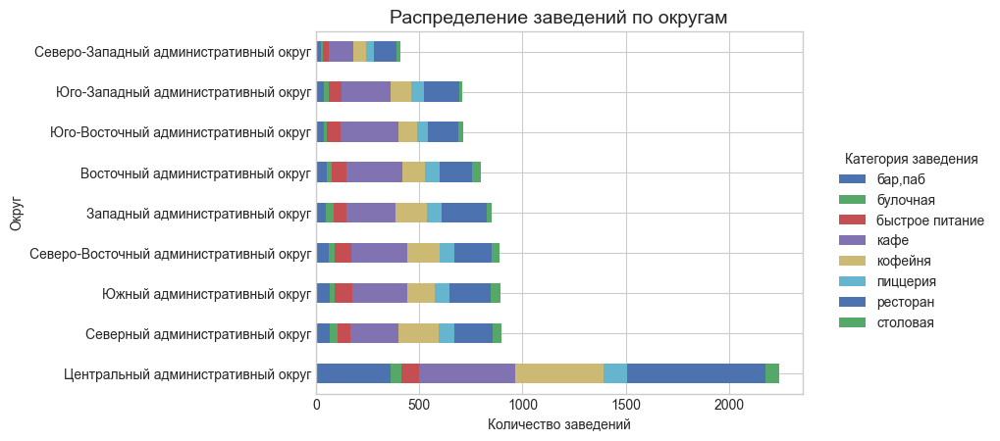

In [34]:
# Визуализируем данные накоплением на горизонтальной гистограмме
with plt.style.context('seaborn-deep'):
    district_table.drop(columns = 'total').plot(kind='barh', stacked= True)
    plt.title('Распределение заведений по округам', fontsize= 14 )
    plt.legend(title = 'Категория заведения', bbox_to_anchor=(1.4, 0.7), fontsize=10)
    plt.xlabel('Количество заведений')
    plt.ylabel('Округ')
    plt.show()

<div style="border:solid Green 2px; padding: 20px">
    
Значительно выделяется центральный административный округ - здесь более 2000 заведений, в то время как в других округах цифра не превышает 1000. Также видны ранее определенные лидеры по категориям - кафе и рестораны. Причем во всех округах кроме центрального количество кафе больше или сопоставимо с количеством ресторанов, а в центральном АО рестораны превалируют над кафе

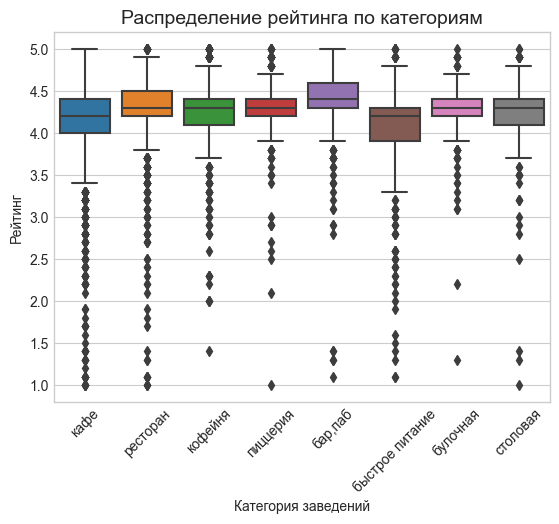

In [35]:
# Визуализируем распределение средних рейтингов по категориям заведений
sns.boxplot(x = 'category', y = 'rating', data = data)
plt.title('Распределение рейтинга по категориям', fontsize= 14)
plt.xlabel('Категория заведений')
plt.xticks(rotation=45)
plt.ylabel('Рейтинг')
plt.show()

<div style="border:solid Green 2px; padding: 20px">
    
В целом во всех категориях встречаются как и отличные оценки, так и плохие. Самые лучшие заведения, исходя из анализа, это бары и пабы - бокс плот имеет сильное смещение в зону с отличной оценкой, а медиана равняется около 4,5 баллов. Ниже всех нахятся заведения с быстрым питанием. Также стоит отметить пиццерию и булочную - взгляды пользователей здесь очень сходятся и боксплоты имеют сжатый вид. А вот в кафе наблюдается существенный разброс по оценкам - сам боксплот имеет растянутую форму, охватывая большую часть оценок от 3,5 до 5, а "выбросы" идут вплоть до единицы.

In [36]:
# Отобразим фоновую картограмму (хороплет) со средним рейтингом заведений каждого округа и добавим маркеры заведений

# загружаем JSON-файл с границами округов Москвы
try:
    with open('D:\Учеба\Аналитик данных\Проекты\Проект 9 Рынок заведений Москвы\\admin_level_geomap.geojson', 
              encoding='utf-8') as f:
        geo_json = json.load(f)
except:
    with open('/datasets/admin_level_geomap.geojson', encoding='utf-8') as f:
        geo_json = json.load(f)
    
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=data.groupby('district', as_index = False).agg({'rating':'mean'}),
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по округам',
).add_to(m)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер с кастомной иконкой в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    # создаём объект с собственной иконкой
    icon_url = 'https://img.icons8.com/bubbles/256/food.png'  
    icon = CustomIcon(icon_url, icon_size=(40, 40))
    
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)
    
# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis = 1)
    
# выводим карту
m

<div style="border:solid Green 2px; padding: 20px">
    
На карте ярко выделяется Центральный административный округ Москвы - средний рейтинг составлят порядка 4,38, в то время как наиболее низкий рейтинг 4,1 нблюдается в Юго-Восточном административном округе

In [37]:
# Создадим сводную таблицу распределения заведений на категории по улицам
street_table = data.pivot_table(index = 'street', columns = 'category', values = 'name', aggfunc = 'count')
street_table['total'] = street_table.sum(axis=1)
street_top = street_table.sort_values(by = 'total', ascending = False).head(15)

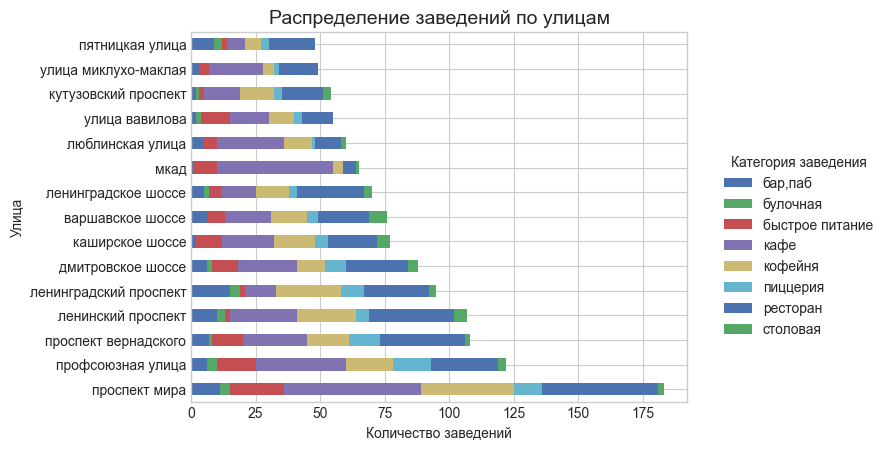

In [38]:
# Визуализируем данные накоплением на горизонтальной гистограмме
with plt.style.context('seaborn-deep'):
    street_top.drop(columns = 'total').plot(kind='barh', stacked= True)
    plt.title('Распределение заведений по улицам', fontsize= 14 )
    plt.legend(title = 'Категория заведения', bbox_to_anchor=(1.4, 0.7), fontsize=10)
    plt.xlabel('Количество заведений')
    plt.ylabel('Улица')
    plt.show()

<div style="border:solid Green 2px; padding: 20px">
    
Больше всего заведений находится на Проспекте Мира - здесь более 175 мест общепита, где лидирующие позиции также занимают кафе, кофейни и рестораны. Также выделяется МКАД - здесь не так много заведений, однако большая масса кафе

In [39]:
# Определим заведения, которые находятся в единственном количестве на улице
street_one = data[data['street'].isin(
             street_table[street_table['total'] == 1].index)
                 ]
street_one.head()

,name,category,address,street,district,hours,is_24/7,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
15,дом обеда,столовая,"москва, улица бусиновская горка, 2",улица бусиновская горка,Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,False,55.885890,37.493264,4.1,средние,средний счёт:300–500 ₽,400.0,NaN,0,180.0
21,7/12,кафе,"москва, прибрежный проезд, 7",прибрежный проезд,Северный административный округ,"ежедневно, 10:00–22:00",False,55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN
25,в парке вкуснее,кофейня,"москва, парк левобережный",парк левобережный,Северный административный округ,"ежедневно, 10:00–21:00",False,55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN
58,coffeekaldi's,кофейня,"москва, угличская улица, 13, стр. 8",угличская улица,Северо-Восточный административный округ,"ежедневно, 09:00–22:00",False,55.900316,37.570558,4.1,средние,средний счёт:500–800 ₽,650.0,NaN,1,NaN
60,чебуречная история,кофейня,"москва, ландшафтный заказник лианозовский",ландшафтный заказник лианозовский,Северо-Восточный административный округ,"ежедневно, 10:00–22:00",False,55.899845,37.570488,4.9,средние,NaN,NaN,NaN,1,NaN


In [40]:
# Определим общее количество улиц и долю улиц с одним заведением
display(f"Всего улиц в датафрейме: {data['street'].nunique()}")
print(f"Улиц с одним заведением: {street_one['street'].nunique()}")

'Всего улиц в датафрейме: 1447'

Улиц с одним заведением: 457


In [41]:
# Отобразим данные заведения на карте

# создаём карту Москвы
Mmap = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(Mmap)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер с кастомной иконкой в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    # создаём объект с собственной иконкой
    icon_url = 'https://img.icons8.com/bubbles/256/food.png'  
    icon = CustomIcon(icon_url, icon_size=(40, 40))
    
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)
    
# применяем функцию create_clusters() к каждой строке датафрейма
street_one.apply(create_clusters, axis = 1)
    
# выводим карту
Mmap

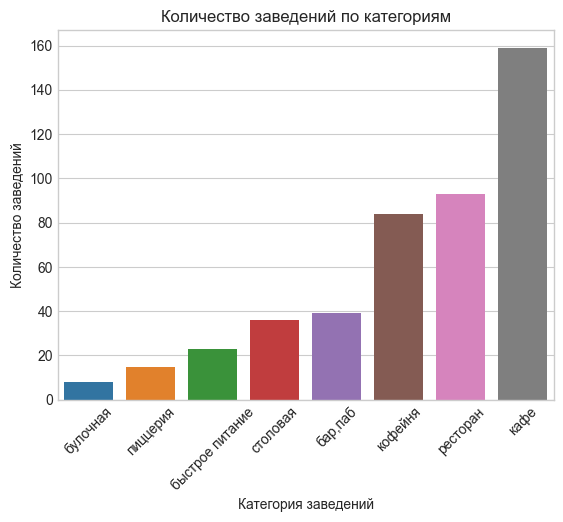

In [42]:
# Отобразим гисотграмму для распределения заведений по категориям
sns.barplot(x = 'category', y = 'name', 
            data = street_one.groupby('category', as_index = False).agg({'name':'count'}).sort_values(by = 'name'))
plt.title('Количество заведений по категориям')
plt.xlabel('Категория заведений')
plt.xticks(rotation=45)
plt.ylabel('Количество заведений')
plt.show()

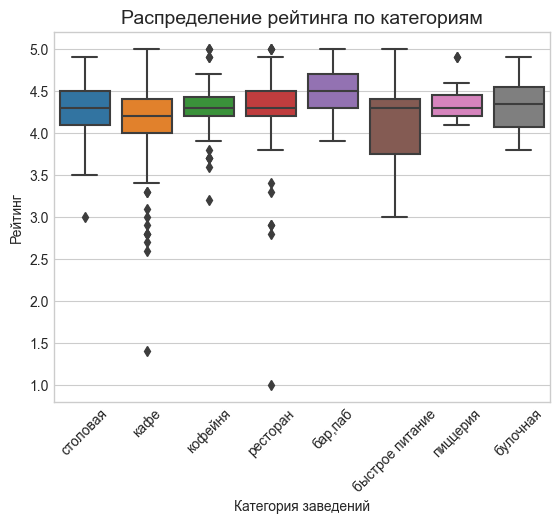

In [43]:
# Рассмотрим рейтинг данных заведений
sns.boxplot(x = 'category', y = 'rating', data = street_one)
plt.title('Распределение рейтинга по категориям', fontsize= 14)
plt.xlabel('Категория заведений')
plt.xticks(rotation=45)
plt.ylabel('Рейтинг')
plt.show()

<div style="border:solid Green 2px; padding: 20px">
    
В единственном количестве заведения встречаются по всей Москве, во всех округах - в данном случае закономерности нет. Всего в датасете представлено 1447 улиц, в то время как улиц с одним заведением 457 - около 30%, довольно высокая доля. Места представлены во всех категориях - от булочных и столовых до ресторанов, причем распределение по количеству в целом повторяет генеральную совокупность. Заведения имеют в общей массе хорошие рейтинги - буквально единичные плохие оценки выбиваются из общей картины.  <br>
Таким образом можно сделать вывод, что это заведения, которые следят за своими рейтингами и предоставляемыми услугами: ценят своих клиентов.

In [44]:
# Расчет медианного чека заведений по округам
data.groupby('district').agg({'middle_avg_bill':'median'}).sort_values(by = 'middle_avg_bill', ascending = False)

,middle_avg_bill
district,
Западный административный округ,1000.0
Центральный административный округ,1000.0
Северо-Западный административный округ,700.0
Северный административный округ,650.0
Юго-Западный административный округ,600.0
Восточный административный округ,575.0
Северо-Восточный административный округ,500.0
Южный административный округ,500.0
Юго-Восточный административный округ,450.0


In [45]:
# Отобразим фоновую картограмму (хороплет) с медианным чеком заведений каждого округа

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# Создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=data.groupby('district', as_index = False).agg({'middle_avg_bill':'median'}),
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный чек заведений по округам',
).add_to(m)
    
# выводим карту
m

<div style="border:solid Green 2px; padding: 20px">
    
Как и ожидалось, цены в Центральном округе выше, чем в других районах. Однако сопоставимый средний чек демонстрирует Западный АО. Можно предположить, что это влияние заведений в Аэропорте, однако на карте выше заведений в данном районе нет. Таким образом самые дорогие АО это Центральный и Западный. <br>
Другие районы имеют цены ниже - самые дешевые АО это Южный, Юго-Восточный и Северо-Восточный

<div style="border:solid Green 2px; padding: 20px">
    
**По итогу анализа данных можно сделать следующие заключения:**
1. В датасете представлено 8 категорий заведений. Менее распространенные - булочные, порядка 250 заведений. Самые часто встречающиеся - ресторан, кафе и кофейня.
2. Количество мест в заведениях в среднем варьируется от 50 до 80 единиц. Самые большие показатели наблюдаются у ресторанов, кофейни, баров и заведений с быстрым питанием.
3. В представленном датасете оснвную массу занимают не сетевые заведения - разделение долей примерно 60 на 40 в пользу не сетевых мест. Однако сетевые заведения преобладают в таких категориях как булочные, пиццерии и кофейни.
4. В самых широко распространенных сетевых заведениях наблюдается более 70 пунктов в Москве, например Шоколадниц порядка 120 заведений.
5. В зависимости от Административного округа наблюдается различие в количестве заведений - больше всего в Центральном АО, более 2000 мест, в то время как в других АО количество не превышает 1000.
6. Во всех категориях имеются заведения с отличиными и плохими оценками. Самые лучшие заведения это бары и пабы - больше всего положительных оценок, а медиана равняется около 4,5 баллов. Ниже всех находятся заведения с быстрым питанием.
7. В Центральном АО находятся заведения с наиболее высоким рейтингом - среднее значение составлят порядка 4.38, в то время как наиболее низкий рейтинг 4.1 нблюдается в Юго-Восточном Административном округе.
8. Улица с самым большим количеством заведений это Проспект Мира - здесь более 175 мест общепита, где лидирующие позиции также занимают кафе, кофейни и рестораны.
9. Самые большие цены в Центральном и Западном АО, в то время как наиболее дешевые заведения находятся в Южном, Юго - Восточном и Северо - Восточном округах.

### Детализация исследования: открытие кофейни

In [46]:
# Выполним срез датасета, чтобы оставить информацию только о кофейнях
data_v = data[data['category'] == 'кофейня']
data_v.shape

(1413, 16)

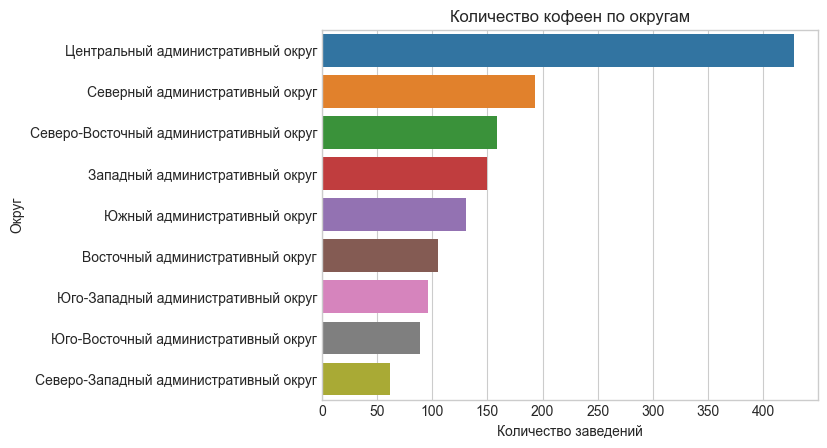

In [47]:
# Отобразим гистограмму для распределения кофеен по округам
sns.barplot(data = data_v.groupby('district', as_index = False).agg({'name':'count'})\
            .sort_values(by = 'name', ascending = False), 
            x = 'name', y = 'district')
plt.title('Количество кофеен по округам')
plt.xlabel('Количество заведений')
plt.ylabel('Округ')
plt.show()

In [48]:
# Отобразим фоновую картограмму (хороплет) с количеством коффен по округам

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=data_v.groupby('district', as_index = False).agg({'name':'count'}),
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество заведений по округам',
).add_to(m)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер с кастомной иконкой в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    # создаём объект с собственной иконкой
    icon_url = 'https://img.icons8.com/bubbles/256/food.png'  
    icon = CustomIcon(icon_url, icon_size=(40, 40))
    
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)
    
# применяем функцию create_clusters() к каждой строке датафрейма
data_v.apply(create_clusters, axis = 1)
    
# выводим карту
m

<div style="border:solid Green 2px; padding: 20px">
    
Всего в датасете представлена информация о 1413 кофейнях. Их плотность расположения совпадает с базовым датафреймом - больше всего заведений находится в Центральном АО, более 400 мест, в то время как в Северо-Западном АО их чуть более 60.

In [49]:
# Отобразим фоновую картограмму (хороплет) со средним рейтингом по округам и отметим круглосуточные заведения

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=data_v.groupby('district', as_index = False).agg({'rating':'mean'}),
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по округам',
).add_to(m)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер с кастомной иконкой в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    # создаём объект с собственной иконкой
    icon_url = 'https://img.icons8.com/bubbles/256/food.png'  
    icon = CustomIcon(icon_url, icon_size=(40, 40))
    
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)
    
# применяем функцию create_clusters() к каждой строке датафрейма
data_v[data_v['is_24/7'] == True].apply(create_clusters, axis = 1)
    
# выводим карту
m

<div style="border:solid Green 2px; padding: 20px">
    
Самый лучший средний рейтинг наблдюается в заведениях, расположенных в Центральном, Восточном, Северном, Северо - Западном и Юго-Западном АО. В целом можно отметить довольно хороший средний рейтинг заведений по категории кофейня. <br>
Круглосуточных заведений очень мало - всего 59 из 1413 мест. Наибольшая масса (25 ед.) также находится в Центральном АО.<br>
Также стоит отметить кофейню "wild bean cafe" - в основном данная сеть находится на окраинах и имеет неплохие оценки. Также очень много "Шоколадниц", которые работают круглосуточно.

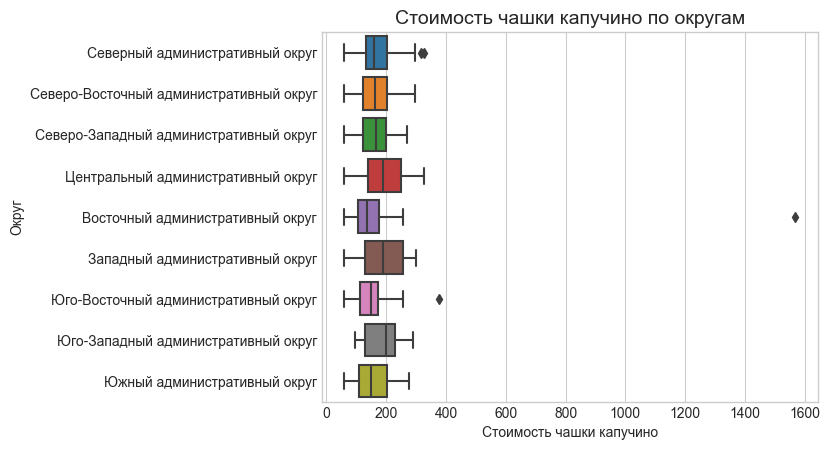

In [50]:
# Рассмотрим распределение стоимости чашки капучино по округам
sns.boxplot(x = 'middle_coffee_cup', y = 'district', data = data_v, orient = 'h')
plt.title('Стоимость чашки капучино по округам', fontsize= 14)
plt.xlabel('Стоимость чашки капучино')
plt.ylabel('Округ')
plt.show()

In [51]:
# Рассмотрим выброс
data_v[data_v['middle_coffee_cup'] == data_v['middle_coffee_cup'].max()]

,name,category,address,street,district,hours,is_24/7,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2856,шоколадница,кофейня,"москва, большая семёновская улица, 27, корп. 1",большая семёновская улица,Восточный административный округ,"ежедневно, 08:00–23:00",False,55.782268,37.709022,4.2,средние,цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0


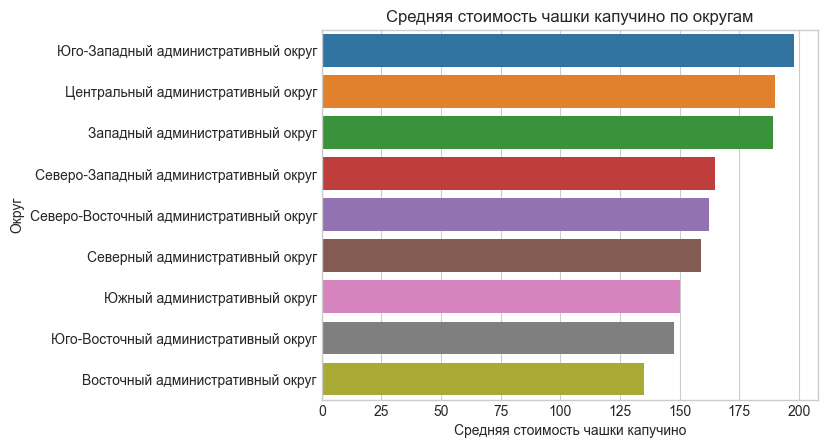

In [52]:
# Отобразим гистограмму для распределения средней стоимости чашки кофе по округам
sns.barplot(data = data_v.groupby('district', as_index = False).agg({'middle_coffee_cup':'median'})\
            .sort_values(by = 'middle_coffee_cup', ascending = False), 
            x = 'middle_coffee_cup', y = 'district')
plt.title('Средняя стоимость чашки капучино по округам')
plt.xlabel('Средняя стоимость чашки капучино')
plt.ylabel('Округ')
plt.show()

<div style="border:solid Green 2px; padding: 20px">
    
Стоимость чашки капучино разнится в зависимости от заведения и его расположения - так, например, в Юго-Западном АО капучино не стоит дешевле 100 рублей, а в Центральном АО  максимальная цена превышает 300 рублей. В то время как в Восточном АО стоимость начинается примерно от 70 рублей и не превышает 230, со средней стоимостью 130 рублей.
<br> Также в данных определен выброс - диапазон стоимости в одной кофейне Шоколадница указан 230 - 2907. Вероятно "семерку" добавили по ошибке и действительный диапазон составляет 230 - 290 рублей.

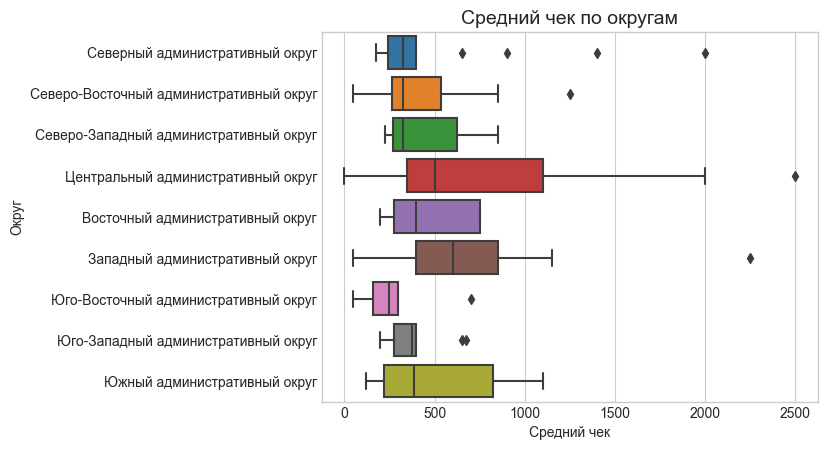

In [53]:
# Рассмотрим распределение среднего чека по округам
sns.boxplot(x = 'middle_avg_bill', y = 'district', data = data_v, orient = 'h')
plt.title('Средний чек по округам', fontsize= 14)
plt.xlabel('Средний чек')
plt.ylabel('Округ')
plt.show()

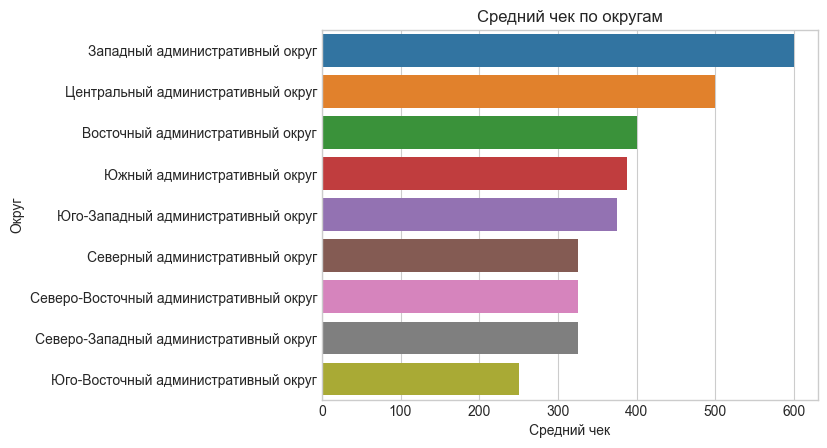

In [54]:
# Отобразим гистограмму для распределения среднего чека по округам
sns.barplot(data = data_v.groupby('district', as_index = False).agg({'middle_avg_bill':'median'})\
            .sort_values(by = 'middle_avg_bill', ascending = False), 
            x = 'middle_avg_bill', y = 'district')
plt.title('Средний чек по округам')
plt.xlabel('Средний чек')
plt.ylabel('Округ')
plt.show()

<div style="border:solid Green 2px; padding: 20px">
    
Средний чек, как и стоимость чашки капучино сильно варьируется в зависимости от расположения заведения и конкретного места. Самые дорогие АО это Западный, Центральный и Южный - чек может достигать порядка 2000 рублей, в то время как в Юго-Западном и Юго-Восточном не превышает и 500.

### Рекомендации по открытию кофейни

<div style="border:solid Green 2px; padding: 20px">

Исходя из проведенного анализа наиболее предпочтительным районом является **Западный Административный округ** - здесь наиболее высокие цены на еду и кофе (возможность для демпинга и потенциал для быстрой окупаемости вложений), среднее количество кофеен (не такая высокая плотность и конкуренция, как в Центральном АО), заведения с не очень высоким рейтингом (возможность быть привлекательными на фоне других).

Чтобы определить предпочтительные места расположения кофейни внутри Западного АО требуется дополнительная информация - стоимость аренды помещений, а также трафик людей. Если кофейня предполагается в стиле «Central Perk», то это больше похоже на уютное домашнее место для встреч и посиделок с друзьями - а значит нет смысла привязываться к офисам и стремиться двигаться к Центральному округу с повышенной арендой. Наиболее выгодными местами могут стать районы, которые близки к различным ТЦ, кинотеатрам и тд, где часто встречаются компании и проводят время.

1. Больше всего кофеен расположено в Центральном районе - конкуренция очень высокая. Далее идут Северный, Северо - Восточный и Западный АО. Меньше всего кофеен в Северо - Западном АО.
2. Лучшие рейтинги в Центральном, Восточном, Северном, Северо - Западном и Юго-Западном АО.
3. Круглосуточных заведений очень мало, вероятнее всего, что это связано с форматом и целевым клиентом - тяжело быть одинаково привлекательным для дневных и ночных клиентов.
4. Самая дорогая чашка капучино в Юго-Западном, Центральном и Западном АО. Дешевле всего в Восточном.
5. Самый высокий средний чек в Западном, Центральном и Южном АО.